In [2]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(context= "notebook", color_codes=True)
plt.style.use('bmh')
%matplotlib inline

pd.set_option('display.max_columns', None)
pd.set_option('expand_frame_repr', False)



In [3]:
df = pd.read_csv('concrete_data.csv')
df.columns = ['Cement', 'Blast_Furnace_Slag', 'Fly_Ash', 'Water', 'Superplasticizer',
            'Coarse_Aggregate', 'Fine_Aggregate', 'Age', 'Strength']
df.head()

,Cement,Blast_Furnace_Slag,Fly_Ash,Water,Superplasticizer,Coarse_Aggregate,Fine_Aggregate,Age,Strength
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.99
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.89
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.27
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.05
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.30


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1030 entries, 0 to 1029
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Cement              1030 non-null   float64
 1   Blast_Furnace_Slag  1030 non-null   float64
 2   Fly_Ash             1030 non-null   float64
 3   Water               1030 non-null   float64
 4   Superplasticizer    1030 non-null   float64
 5   Coarse_Aggregate    1030 non-null   float64
 6   Fine_Aggregate      1030 non-null   float64
 7   Age                 1030 non-null   int64  
 8   Strength            1030 non-null   float64
dtypes: float64(8), int64(1)
memory usage: 72.5 KB


In [5]:
df.describe()

,Cement,Blast_Furnace_Slag,Fly_Ash,Water,Superplasticizer,Coarse_Aggregate,Fine_Aggregate,Age,Strength
count,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000
mean,281.167864,73.895825,54.188350,181.567282,6.204660,972.918932,773.580485,45.662136,35.817961
std,104.506364,86.279342,63.997004,21.354219,5.973841,77.753954,80.175980,63.169912,16.705742
min,102.000000,0.000000,0.000000,121.800000,0.000000,801.000000,594.000000,1.000000,2.330000
25%,192.375000,0.000000,0.000000,164.900000,0.000000,932.000000,730.950000,7.000000,23.710000
50%,272.900000,22.000000,0.000000,185.000000,6.400000,968.000000,779.500000,28.000000,34.445000
75%,350.000000,142.950000,118.300000,192.000000,10.200000,1029.400000,824.000000,56.000000,46.135000
max,540.000000,359.400000,200.100000,247.000000,32.200000,1145.000000,992.600000,365.000000,82.600000


In [6]:
df.describe()

,Cement,Blast_Furnace_Slag,Fly_Ash,Water,Superplasticizer,Coarse_Aggregate,Fine_Aggregate,Age,Strength
count,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000
mean,281.167864,73.895825,54.188350,181.567282,6.204660,972.918932,773.580485,45.662136,35.817961
std,104.506364,86.279342,63.997004,21.354219,5.973841,77.753954,80.175980,63.169912,16.705742
min,102.000000,0.000000,0.000000,121.800000,0.000000,801.000000,594.000000,1.000000,2.330000
25%,192.375000,0.000000,0.000000,164.900000,0.000000,932.000000,730.950000,7.000000,23.710000
50%,272.900000,22.000000,0.000000,185.000000,6.400000,968.000000,779.500000,28.000000,34.445000
75%,350.000000,142.950000,118.300000,192.000000,10.200000,1029.400000,824.000000,56.000000,46.135000
max,540.000000,359.400000,200.100000,247.000000,32.200000,1145.000000,992.600000,365.000000,82.600000


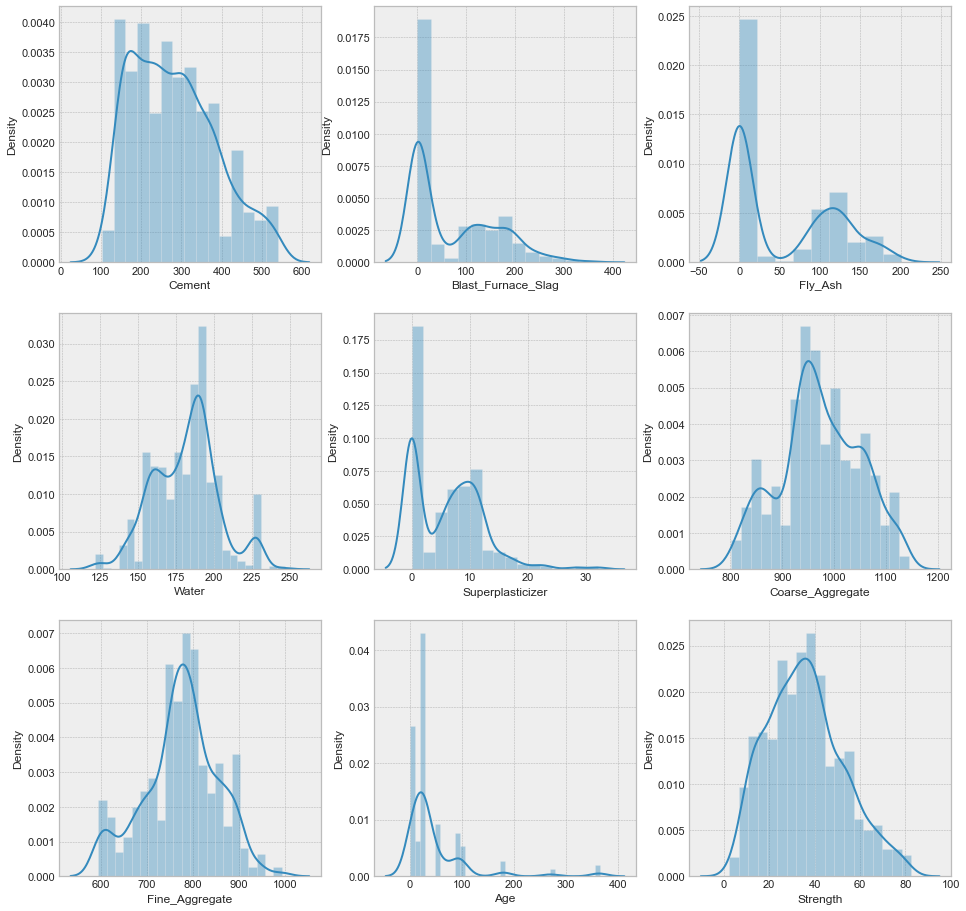

In [7]:
fig, axes= plt.subplots(3, 3, figsize= (16, 16))

col_num = 0
col_names = df.columns.tolist()

for i in range(3):
    for j in range(3):
        sns.distplot(df[col_names[col_num]], ax= axes[i][j]);
        col_num += 1

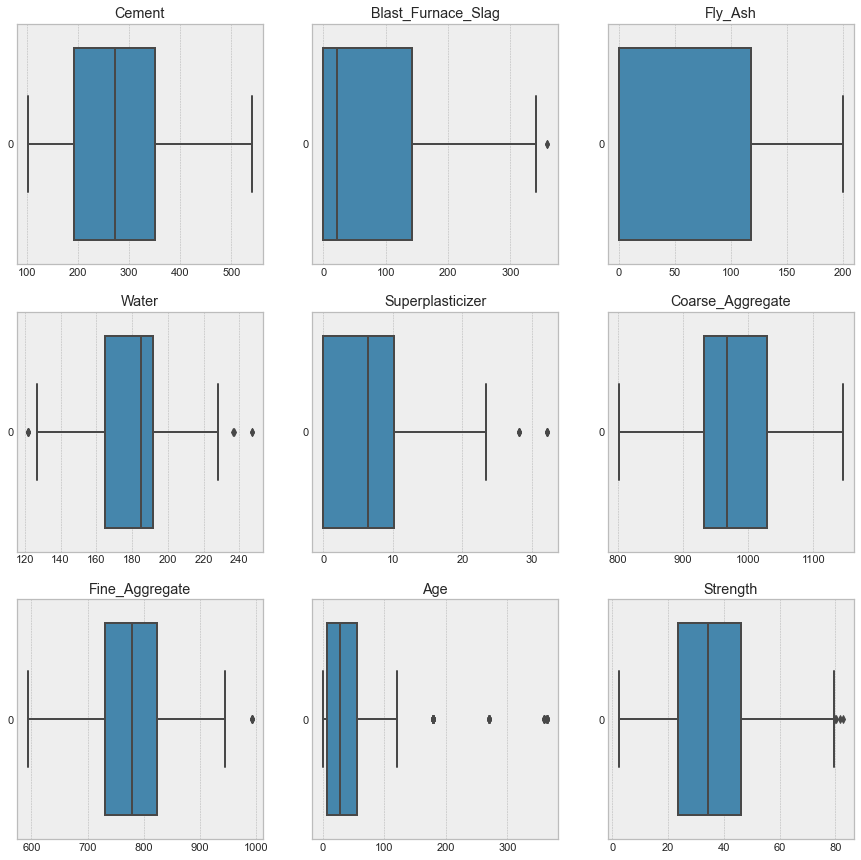

In [8]:
#check the data for outliers

fig, axes = plt.subplots(3, 3, figsize= (15, 15))

col_num = 0
col_names = df.columns.tolist()

for i in range(3):
    for j in range(3):
        sns.boxplot(data= df[col_names[col_num]], ax= axes[i][j], orient= 'h').set_title(col_names[col_num]);
        col_num += 1


In [9]:
# Removing ouliers

outlier_col = ['Blast_Furnace_Slag', 'Water', 'Superplasticizer', 'Fine_Aggregate', 'Age']

def remove_outliers(df, col):
    '''
    df: The dataframe
    col: the column name in the dataframe
    '''

    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1

    lower_limit = q1 - (iqr * 1.5)
    upper_limit = q3 + (iqr * 1.5)

    df_capped = df[(df[col] > lower_limit) & (df[col] < upper_limit)]

    return df_capped

for column in outlier_col:
    df = remove_outliers(df, column)

df.head()

,Cement,Blast_Furnace_Slag,Fly_Ash,Water,Superplasticizer,Coarse_Aggregate,Fine_Aggregate,Age,Strength
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.99
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.89
5,266.0,114.0,0.0,228.0,0.0,932.0,670.0,90,47.03
8,266.0,114.0,0.0,228.0,0.0,932.0,670.0,28,45.85
10,198.6,132.4,0.0,192.0,0.0,978.4,825.5,90,38.07


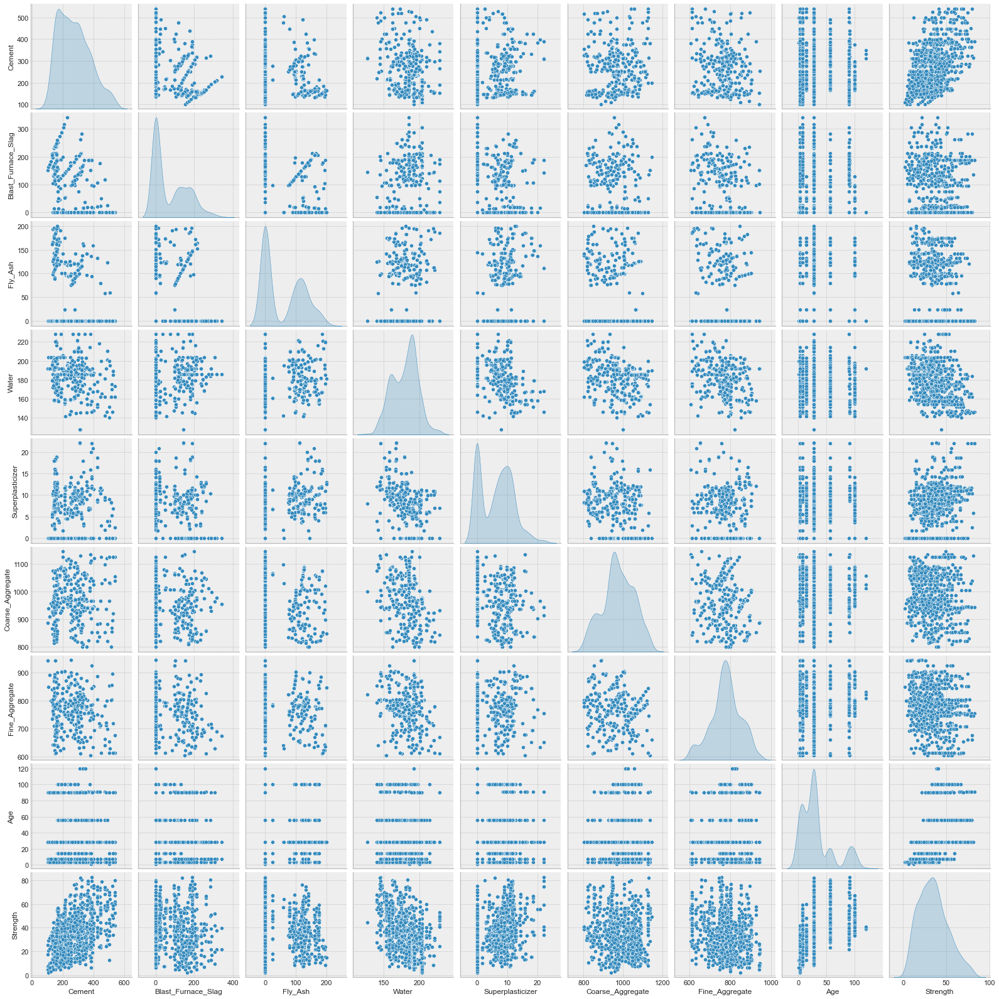

In [10]:
# Multivariate plotting

sns.pairplot(data= df, diag_kind= 'kde');

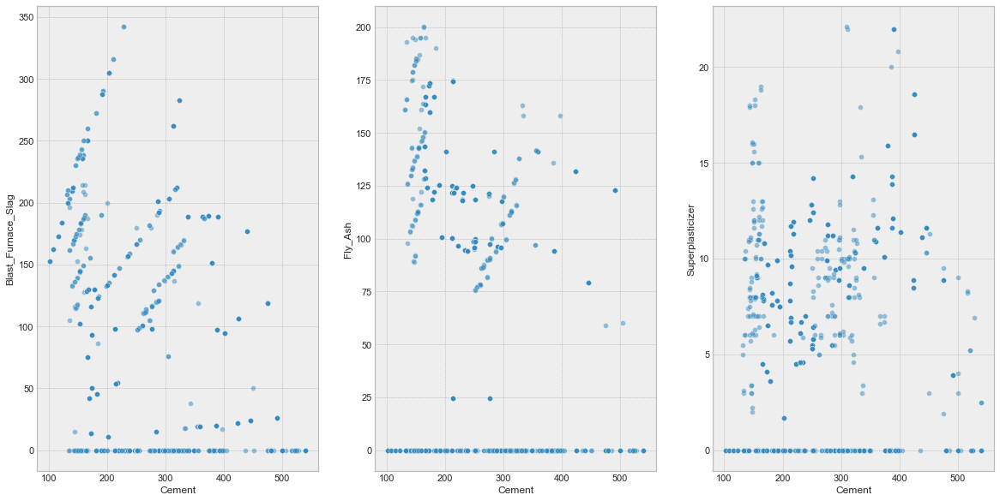

In [12]:
# plotted the columns that have 0 values

plot_list = ['Blast_Furnace_Slag', 'Fly_Ash', 'Superplasticizer']

fig, axes = plt.subplots(1, 3, figsize= (20, 10));

for i in plot_list:
    sns.scatterplot(x= 'Cement', y= i, data= df, ax= axes[plot_list.index(i)], alpha= 0.5);

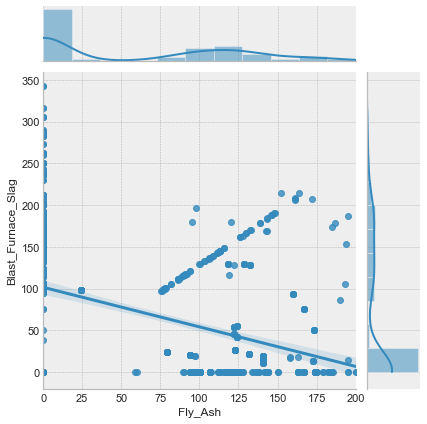

In [13]:
sns.jointplot(x='Fly_Ash', y='Blast_Furnace_Slag', data= df, kind='reg');

# the zero values might affect the model so create a branch where you have no 0 values

# Feature Engineering

In [14]:
# create a Cement/water ratio 
# create a coarse/fine aggregate ratio

df_copy = df.copy()

df_copy['Cement_Water_ratio'] = df_copy['Cement']/df_copy['Water']
df_copy['Coarse_Fine_Agg_ratio'] = df_copy['Coarse_Aggregate']/df_copy['Fine_Aggregate']
df_copy['avg_Aggregate'] = (df_copy['Coarse_Aggregate'] + df_copy['Fine_Aggregate']) / 2
df_copy.drop(columns= ['Cement', 'Water', 'Coarse_Aggregate', 'Fine_Aggregate'], inplace= True)


In [15]:
df.columns

Index(['Cement', 'Blast_Furnace_Slag', 'Fly_Ash', 'Water', 'Superplasticizer',
       'Coarse_Aggregate', 'Fine_Aggregate', 'Age', 'Strength'],
      dtype='object')

In [16]:
df_copy.head()

,Blast_Furnace_Slag,Fly_Ash,Superplasticizer,Age,Strength,Cement_Water_ratio,Coarse_Fine_Agg_ratio,avg_Aggregate
0,0.0,0.0,2.5,28,79.99,3.333333,1.538462,858.00
1,0.0,0.0,2.5,28,61.89,3.333333,1.560651,865.50
5,114.0,0.0,0.0,90,47.03,1.166667,1.391045,801.00
8,114.0,0.0,0.0,28,45.85,1.166667,1.391045,801.00
10,132.4,0.0,0.0,90,38.07,1.034375,1.185221,901.95


<AxesSubplot:>

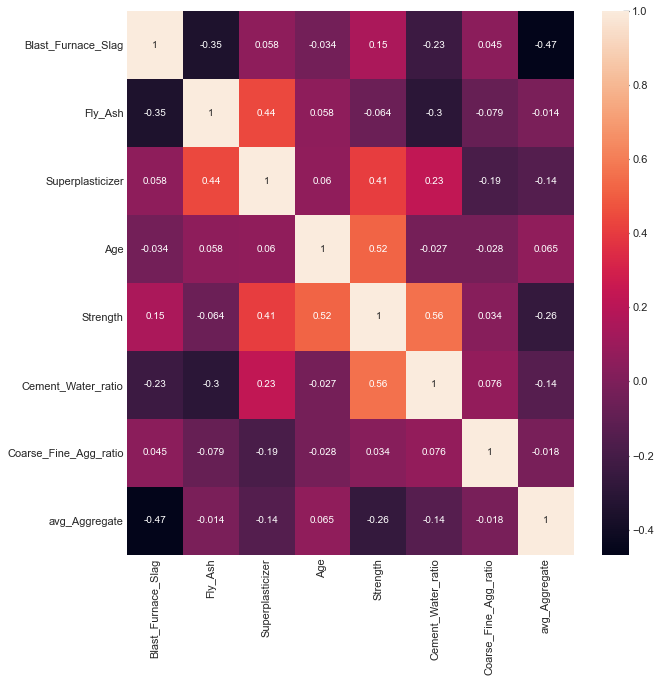

In [17]:
plt.figure(figsize=(10,10))
sns.heatmap(df_copy.corr(), fmt= '.2g', annot= True)

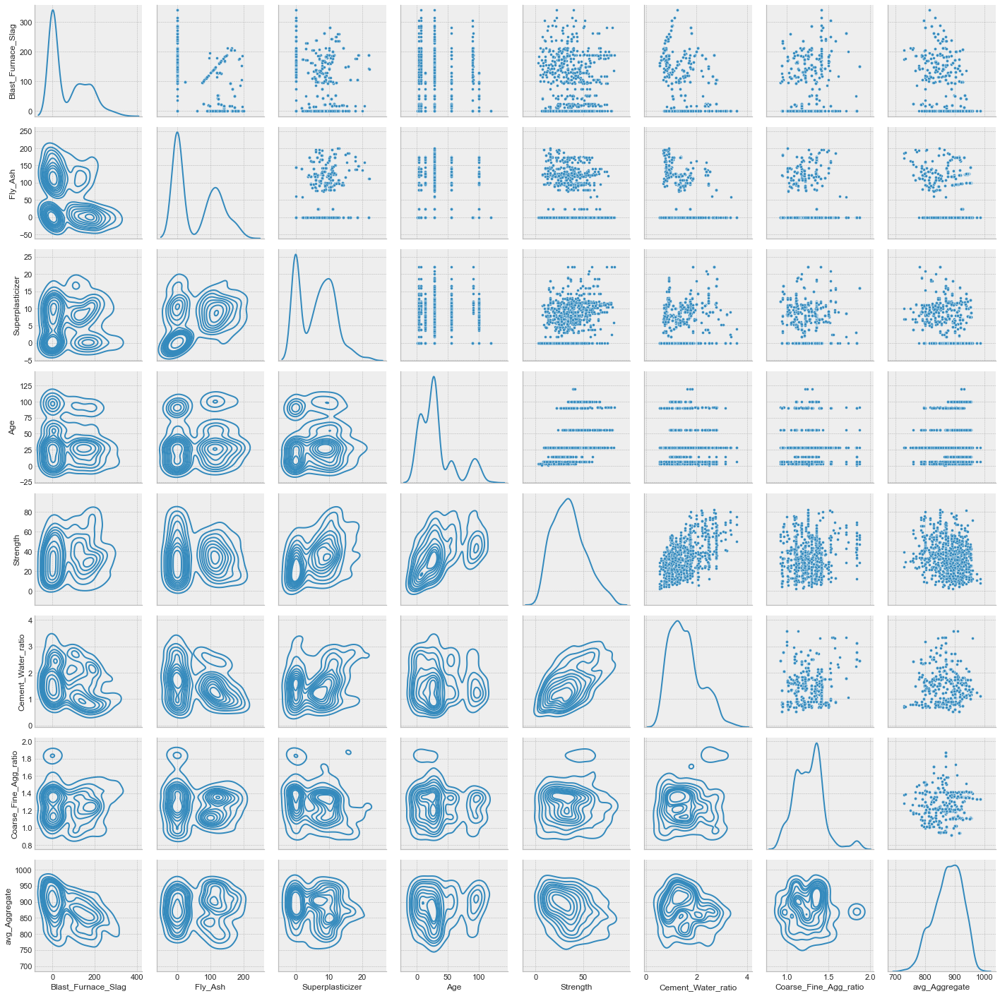

In [18]:
g = sns.PairGrid(df_copy, diag_sharey= False)
g.map_upper(sns.scatterplot, s=15)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw=2)

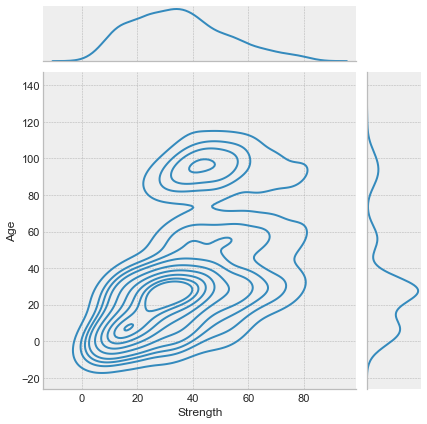

In [19]:
sns.jointplot(x= 'Strength', y= 'Age', data= df_copy, kind= 'kde');

In [20]:
df.columns

Index(['Cement', 'Blast_Furnace_Slag', 'Fly_Ash', 'Water', 'Superplasticizer',
       'Coarse_Aggregate', 'Fine_Aggregate', 'Age', 'Strength'],
      dtype='object')

# Algo modeling

In [39]:
X = df_copy.drop('Strength', axis= 1)
X.head()

,Blast_Furnace_Slag,Fly_Ash,Superplasticizer,Age,Cement_Water_ratio,Coarse_Fine_Agg_ratio,avg_Aggregate
0,0.0,0.0,2.5,28,3.333333,1.538462,858.00
1,0.0,0.0,2.5,28,3.333333,1.560651,865.50
5,114.0,0.0,0.0,90,1.166667,1.391045,801.00
8,114.0,0.0,0.0,28,1.166667,1.391045,801.00
10,132.4,0.0,0.0,90,1.034375,1.185221,901.95


In [40]:
y = df_copy['Strength']
y.head()

0     79.99
1     61.89
5     47.03
8     45.85
10    38.07
Name: Strength, dtype: float64

In [23]:
from sklearn import model_selection
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, GridSearchCV

from sklearn import metrics
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn import model_selection

from sklearn import linear_model
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor


In [52]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.25, random_state= 42)

In [55]:
evaluation = {'Metrics': ['Root Mean Squared Error (RMSE)', 'Mean Absolute Error (MAE)', 'Mean Squared Error (MSE)', 'R2 score', 'CV-mean']}

def evaluate_model(name, X_train, y_train, X_test, y_test, types, alg, plot=True):
    global evaluation, pred

    alg.fit(X_train, y_train)
    print(f'Score: {alg.score(X_test, y_test)}')

    if plot:
        fig, axes= plt.subplots(2, 1, figsize= (20, 10))
        try:
            if types == 'Coefs':
                print(f'Intercept: {alg.intercept_}')
                try:
                    coefs = pd.DataFrame({'coefs': alg.coef_, 'col': X.columns})
                except:
                    coefs = pd.DataFrame({'coefs': alg.coef_[0], 'col': X.columns})
                sns.barplot(x= 'col', y='coefs', data= coefs, ax= axes[1]);
            else:
                features = pd.DataFrame({'features': alg.feature_importance_, 'col':X.columns})
                sns.barplot(x='col', y= 'features', data=features, ax= axes[1]);
        except:
            pass
    else:
        plt.figure(figsize= (20, 5));
        axes = [None]

    # prediction part
    pred = alg.predict(X_test)
    rmsecm = np.sqrt(mean_squared_error(y_test, pred))
    mae = mean_absolute_error(y_test, pred)
    mse = mean_squared_error(y_test, pred)
    r2 = r2_score(y_test, pred)

    p = pd.DataFrame(pred, columns= [0])
    p['Type'] = 'Predictions'
    p['n'] = list(range(p.shape[0]))
    t= y_test.copy()
    t = t.reset_index().set_index('index')
    t.columns = [0]
    t['Type'] = 'Actual'
    t = t[t[0] != 'Actual']
    t['n'] = list(range(p.shape[0]))
    x= pd.concat([p,t], axis= 0).reset_index()
    sns.lineplot(x='n', y= 0, hue= 'Type', data= x, markers= ['o', 'o'], style= 'Type', ax= axes[0]);

    cv = cross_val_score(alg, X, y, cv= 10)
    cv_mean = cv.ravel().mean()

    evaluation[name]= [rmsecm, mae, mse, r2, cv_mean]
    df_ev = pd.DataFrame(evaluation)
    plt.show()
    return df_ev, cv

Score: 0.7411648307980944
Intercept: -27.77726365435855


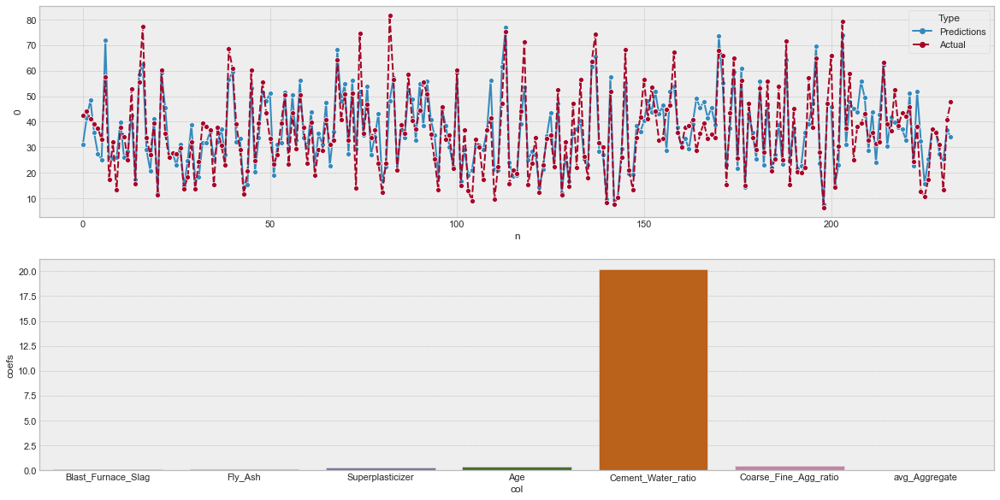

,Multiple Regression
Metrics,
Root Mean Squared Error (RMSE),8.249201
Mean Absolute Error (MAE),6.447833
Mean Squared Error (MSE),68.049316
R2 score,0.741165
CV-mean,0.634558


In [57]:
lr = LinearRegression()
evaluation, cv_scores = evaluate_model('Multiple Regression', X_train, y_train, X_test, y_test, 'Coefs', lr)
evaluation.set_index('Metrics')

In [43]:
lr.coef_

array([8.45190405e-02, 6.70955956e-02, 2.39169303e-01, 3.24224783e-01,
       2.01998441e+01, 4.43556916e-01, 1.00480369e-02])